In [50]:
import torch
import torchvision
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchvision import datasets, transforms
import scipy
import numpy as np
import pandas as pd
import copy
from sklearn.linear_model import LinearRegression

In [2]:
!PYTORCH_ENABLE_MPS_FALLBACK=1

In [3]:
transform = transforms.Compose([transforms.ToTensor(),
                              transforms.Normalize((0.1307,), (0.3081,)),
                              ])

train_dataset = datasets.MNIST('./mnist/MNIST_data/', download=True, train=True, transform=transform)
test_dataset = datasets.MNIST('./mnist/MNIST_data/', download=True, train=False, transform=transform)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=1024, shuffle=True)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=True)

In [4]:
def crossent_loss(y_hat, y):
    # y_hat has shape (N, 10) for 10 classes, y has shape (N,)
    f = torch.nn.CrossEntropyLoss(reduction='sum')
    return f(y_hat, y)

In [5]:
def probabilties_from_scores(y):
    f = torch.nn.Softmax(dim=1)
    p = f(y)
    return p

In [6]:
def dense_beta_loss(evidential_output, target):
    alphas, betas = evidential_output
    # return loss(alphas/(alphas+betas), target)
    true_alphas = alphas.gather(1,target.view(-1,1))
    true_betas = betas.gather(1,target.view(-1,1))
    return torch.digamma(alphas+betas).sum() - torch.digamma(betas).sum()+torch.digamma(true_betas).sum()-torch.digamma(true_alphas).sum()

def dirichlet_kl_div(alphas, target):
    return torch.lgamma(target.sum(axis=1)) - torch.lgamma(alphas.sum(axis=1)) + torch.lgamma(alphas).sum(axis=1) - torch.lgamma(target).sum(axis=1) + ((target-alphas)*(torch.digamma(target)-torch.digamma(target.sum(axis=1).view(-1,1)))).sum(axis=1)

def dirichlet_loss(alphas, target, regularizer = True):
    true_alphas = alphas.gather(1,target.view(-1,1))
    loss = torch.digamma(alphas.sum(axis=1)).sum() - torch.digamma(true_alphas).sum()
    if regularizer:
        x = torch.ones_like(alphas)*.1
        x[target] = true_alphas
        loss += 0*dirichlet_kl_div(alphas, x).sum()
    return loss

In [7]:
# x = (torch.ones_like(alphas)*.5)
# print(x.shape)
# print(alphas.shape)
# j = torch.arange(x.size(0)).long()
# print(j.shape)
# print(labels_batch.shape)
# x[:, labels_batch] = true_alphas

In [8]:
def evaluate(dataloader, model, device, log=False, regularizer = True):
    correct_count, total_count = 0, 0
    loss = 0
    cross_loss = 0
    for images_batch, labels_batch in dataloader:
        images = images_batch.reshape(images_batch.shape[0], 28*28)
        # alphas, betas = model(images.to(device))
        # probabilities = alphas/(alphas+betas)
        alphas = model(images.to(device))
        # print(alphas.shape)
        probabilities = torch.nn.functional.normalize(alphas,1)
        # probabilities = probabilties_from_scores(scores)
        # loss += dense_beta_loss((alphas,betas),labels_batch)
        loss += dirichlet_loss(alphas, labels_batch, regularizer = regularizer)
        cross_loss += -torch.log(probabilities.gather(1,labels_batch.view(-1,1))).sum()
        pred_label = probabilities.max(1, keepdim=True)[1]
        correct_count += pred_label.eq(labels_batch.to(device).view_as(pred_label)).sum().item()
        total_count += labels_batch.shape[0]

    if log:
        print("Number Of Images Tested =", total_count)
        print("Model Accuracy =", (correct_count/total_count))

    return correct_count/total_count, loss, cross_loss

In [9]:
class Net(torch.nn.Module):
    def __init__(self, layer_sizes, inference_type='regression'):
        super(Net, self).__init__()
        self.layers = torch.nn.ModuleList([torch.nn.Linear(layer_sizes[i], layer_sizes[i+1]) for i in range(len(layer_sizes)-2)])
        self.output_layer = torch.nn.Linear(layer_sizes[-2], layer_sizes[-1])
        self.inference_type = inference_type

    def forward(self, x):
        # x = self.input_instance_norm(x)
        for i in range(len(self.layers)):
            x = self.layers[i](x)
            x = torch.nn.functional.hardtanh_(x) + x
        x = self.output_layer(x)
        if self.inference_type == 'classification':
            x = torch.nn.functional.softmax(x,dim=-1)
        return x

class EvidentialDenseBetaNet(torch.nn.Module):
    def __init__(self, layer_sizes, inference_type='classification'):
        super(EvidentialDenseBetaNet, self).__init__()
        self.layers = torch.nn.ModuleList([torch.nn.Linear(layer_sizes[i], layer_sizes[i+1]) for i in range(len(layer_sizes)-2)])
        self.output_alpha_layer = torch.nn.Linear(layer_sizes[-2], layer_sizes[-1])
        self.output_beta_layer = torch.nn.Linear(layer_sizes[-2], layer_sizes[-1])
        self.inference_type = inference_type
        torch.nn.init.zeros_(self.output_alpha_layer.weight)
        torch.nn.init.zeros_(self.output_beta_layer.weight)
        self.output_alpha_layer.bias.data.fill_(np.log(.5))
        self.output_beta_layer.bias.data.fill_(np.log(.5))

    def forward(self, x):
        # x = self.input_instance_norm(x)
        for i in range(len(self.layers)):
            x = self.layers[i](x)
            x = torch.nn.functional.hardtanh_(x) + x
        alphas = torch.exp(self.output_alpha_layer(x))
        betas = torch.exp(self.output_beta_layer(x))
        return alphas, betas

class EvidentialDirichletNet(torch.nn.Module):
    def __init__(self, layer_sizes, inference_type='classification'):
        super(EvidentialDirichletNet, self).__init__()
        self.layers = torch.nn.ModuleList([torch.nn.Linear(layer_sizes[i], layer_sizes[i+1]) for i in range(len(layer_sizes)-2)])
        self.output_alpha_layer = torch.nn.Linear(layer_sizes[-2], layer_sizes[-1])
        self.output_beta_layer = torch.nn.Linear(layer_sizes[-2], layer_sizes[-1])
        self.inference_type = inference_type
        torch.nn.init.zeros_(self.output_alpha_layer.weight)
        self.output_alpha_layer.bias.data.fill_(np.log(.5))

    def forward(self, x):
        # x = self.input_instance_norm(x)
        for i in range(len(self.layers)):
            x = self.layers[i](x)
            x = torch.nn.functional.hardtanh_(x) + x
        alphas = torch.exp(self.output_alpha_layer(x))
        return alphas

In [10]:
# device = torch.device("cuda:0" if torch.cuda.is_available() else ('mps' if torch.backends.mps.is_available() else "cpu"))
device='cpu'

In [11]:
# model = general_models.FFNetwork([784, 100, 10], 'classification').to(device)
# model = EvidentialDenseBetaNet([784, 200, 100, 10], 'classification').to(device)
model = EvidentialDirichletNet([784, 200, 200, 100, 10], 'classification').to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)

In [12]:
epochs = 1000000
best_loss = float('inf')
for epoch in range(epochs):
    running_loss = 0

    for images_batch, labels_batch in tqdm(train_dataloader):
        images_batch = images_batch.reshape(images_batch.shape[0], 28*28)   # Flatten MNIST images into a 784 long vector

        # forward pass
        y_hat = model(images_batch.to(device))
        y = labels_batch.to(device)
        # L = dense_beta_loss(y_hat, y)
        L = dirichlet_loss(y_hat, y)

        # backward pass
        optimizer.zero_grad()
        L.backward()

        # update parameters
        optimizer.step()

        running_loss += L.item()

    training_loss = running_loss/len(train_dataloader)
    #train_accuracy, train_loss = evaluate(train_dataloader, model)
    test_accuracy, test_loss, cross_loss = evaluate(test_dataloader, model, device, regularizer = False)
    if test_loss < best_loss:
        best_loss = test_loss
        best_model = copy.deepcopy(model)

    if epoch % 1 == 0:
        print("Epoch {} - Training loss: {}  Test Accuracy: {}  Test Loss: {}  Crossentropy Loss: {}".format(epoch, training_loss, test_accuracy, test_loss, cross_loss))

    # if test_accuracy > .98:
    #     break

  0%|          | 0/59 [00:00<?, ?it/s]

100%|██████████| 59/59 [00:02<00:00, 25.05it/s]


Epoch 0 - Training loss: 1559.1227344577596  Test Accuracy: 0.9205  Test Loss: 5764.5  Crossentropy Loss: 5527.2587890625


100%|██████████| 59/59 [00:02<00:00, 26.23it/s]


Epoch 1 - Training loss: 395.6158095537606  Test Accuracy: 0.9516  Test Loss: 2606.34375  Crossentropy Loss: 2523.204345703125


100%|██████████| 59/59 [00:02<00:00, 26.22it/s]


Epoch 2 - Training loss: 209.60503840042372  Test Accuracy: 0.9635  Test Loss: 1764.0703125  Crossentropy Loss: 1718.1602783203125


100%|██████████| 59/59 [00:02<00:00, 25.52it/s]


Epoch 3 - Training loss: 136.60142180879237  Test Accuracy: 0.9724  Test Loss: 1289.234375  Crossentropy Loss: 1257.989990234375


100%|██████████| 59/59 [00:02<00:00, 26.23it/s]


Epoch 4 - Training loss: 101.55103780455508  Test Accuracy: 0.9708  Test Loss: 1161.7734375  Crossentropy Loss: 1132.9122314453125


100%|██████████| 59/59 [00:02<00:00, 25.30it/s]


Epoch 5 - Training loss: 77.2652236162606  Test Accuracy: 0.9764  Test Loss: 965.68359375  Crossentropy Loss: 942.2509765625


100%|██████████| 59/59 [00:02<00:00, 25.29it/s]


Epoch 6 - Training loss: 59.10460805084746  Test Accuracy: 0.9773  Test Loss: 892.125  Crossentropy Loss: 870.7742919921875


100%|██████████| 59/59 [00:02<00:00, 25.44it/s]


Epoch 7 - Training loss: 45.17942266949152  Test Accuracy: 0.9786  Test Loss: 836.34375  Crossentropy Loss: 816.91748046875


100%|██████████| 59/59 [00:02<00:00, 26.11it/s]


Epoch 8 - Training loss: 37.06918697033898  Test Accuracy: 0.9787  Test Loss: 787.7578125  Crossentropy Loss: 769.0446166992188


100%|██████████| 59/59 [00:02<00:00, 25.54it/s]


Epoch 9 - Training loss: 28.97457627118644  Test Accuracy: 0.9792  Test Loss: 737.8046875  Crossentropy Loss: 720.7039794921875


100%|██████████| 59/59 [00:02<00:00, 26.07it/s]


Epoch 10 - Training loss: 22.908542439088983  Test Accuracy: 0.9795  Test Loss: 757.6328125  Crossentropy Loss: 740.5861206054688


100%|██████████| 59/59 [00:02<00:00, 25.37it/s]


Epoch 11 - Training loss: 18.5858547404661  Test Accuracy: 0.9803  Test Loss: 720.3125  Crossentropy Loss: 704.69384765625


100%|██████████| 59/59 [00:02<00:00, 25.84it/s]


Epoch 12 - Training loss: 14.727737685381356  Test Accuracy: 0.9793  Test Loss: 738.8046875  Crossentropy Loss: 722.12744140625


100%|██████████| 59/59 [00:02<00:00, 26.21it/s]


Epoch 13 - Training loss: 12.290154925847459  Test Accuracy: 0.9816  Test Loss: 682.9921875  Crossentropy Loss: 666.925048828125


100%|██████████| 59/59 [00:02<00:00, 26.01it/s]


Epoch 14 - Training loss: 9.607099112817796  Test Accuracy: 0.9817  Test Loss: 712.8515625  Crossentropy Loss: 693.1889038085938


100%|██████████| 59/59 [00:02<00:00, 26.04it/s]


Epoch 15 - Training loss: 8.084174721927965  Test Accuracy: 0.9805  Test Loss: 726.875  Crossentropy Loss: 708.949462890625


100%|██████████| 59/59 [00:02<00:00, 26.19it/s]


Epoch 16 - Training loss: 5.9794259798728815  Test Accuracy: 0.9813  Test Loss: 687.9375  Crossentropy Loss: 671.2667846679688


100%|██████████| 59/59 [00:02<00:00, 26.13it/s]


Epoch 17 - Training loss: 4.954747086864407  Test Accuracy: 0.9815  Test Loss: 703.8359375  Crossentropy Loss: 688.6904296875


100%|██████████| 59/59 [00:02<00:00, 25.95it/s]


Epoch 18 - Training loss: 4.099650754766949  Test Accuracy: 0.9815  Test Loss: 703.359375  Crossentropy Loss: 685.5806884765625


100%|██████████| 59/59 [00:02<00:00, 26.18it/s]


Epoch 19 - Training loss: 3.5928975768008473  Test Accuracy: 0.9825  Test Loss: 686.7734375  Crossentropy Loss: 671.25732421875


100%|██████████| 59/59 [00:02<00:00, 25.78it/s]


Epoch 20 - Training loss: 3.154603085275424  Test Accuracy: 0.9818  Test Loss: 709.3984375  Crossentropy Loss: 693.254638671875


100%|██████████| 59/59 [00:02<00:00, 26.17it/s]


Epoch 21 - Training loss: 2.8614522643008473  Test Accuracy: 0.9819  Test Loss: 692.7734375  Crossentropy Loss: 677.0953369140625


100%|██████████| 59/59 [00:02<00:00, 25.95it/s]


Epoch 22 - Training loss: 2.531647245762712  Test Accuracy: 0.9821  Test Loss: 705.6484375  Crossentropy Loss: 689.7803955078125


100%|██████████| 59/59 [00:02<00:00, 26.04it/s]


Epoch 23 - Training loss: 2.3208835407838984  Test Accuracy: 0.9819  Test Loss: 708.7421875  Crossentropy Loss: 692.91357421875


100%|██████████| 59/59 [00:02<00:00, 26.09it/s]


Epoch 24 - Training loss: 2.1003624867584745  Test Accuracy: 0.9817  Test Loss: 722.1484375  Crossentropy Loss: 701.54345703125


100%|██████████| 59/59 [00:02<00:00, 24.90it/s]


Epoch 25 - Training loss: 1.8459845074152543  Test Accuracy: 0.982  Test Loss: 725.4296875  Crossentropy Loss: 709.3072509765625


100%|██████████| 59/59 [00:02<00:00, 26.07it/s]


Epoch 26 - Training loss: 1.6995249602754237  Test Accuracy: 0.9827  Test Loss: 733.5546875  Crossentropy Loss: 717.646728515625


100%|██████████| 59/59 [00:02<00:00, 25.03it/s]


KeyboardInterrupt: 

In [46]:
for images_batch, labels_batch in test_dataloader:
    images = images_batch.reshape(images_batch.shape[0], 28*28)
    alphas = best_model(images.to(device)).detach()
probs = torch.nn.functional.normalize(alphas,1)
true_alphas = alphas.gather(1,labels_batch.view(-1,1).to(device))
evidences = alphas.sum(axis=1)
losses = torch.digamma(alphas.sum(axis=1)) - torch.digamma(true_alphas).flatten()
entropies = -(probs*probs.log()).sum(axis=1)
df = pd.DataFrame({'label': labels_batch, 'true_alphas': true_alphas.flatten(), 'evidence': evidences, 'loss': losses, 'entropy': entropies})

In [54]:
torch.digamma(evidences + 1)

tensor([8.3689, 8.5980, 7.4231,  ..., 5.5208, 5.5638, 8.4932])

In [66]:
expected_entropy = -(alphas * (torch.digamma(alphas+1) - torch.digamma(evidences + 1).view(-1,1))).sum(axis=1)/evidences

In [47]:
df

,label,true_alphas,evidence,loss,entropy
0,7,4297.064453,4310.188477,0.003050,0.024509
1,9,5402.200195,5420.321777,0.003349,0.027129
2,7,1666.463379,1673.740967,0.004359,0.035221
3,9,5158.921875,5179.170898,0.003919,0.030944
4,5,7575.780273,7599.281738,0.003098,0.025664
...,...,...,...,...,...
9995,8,10534.803711,10562.482422,0.002624,0.022644
9996,5,9804.124023,9829.268555,0.002562,0.021586
9997,0,238.384872,249.335831,0.045007,0.235754
9998,7,244.895508,260.322876,0.061212,0.311538


In [86]:
def plot_identity(x,y):
    x, y = np.array(x), np.array(y)
    low = min(x.min(),y.min())
    high = max(x.max(), y.max())
    points = np.linspace(low, high, 100)
    plt.plot(points, points)

Text(0, 0.5, 'prediction loss')

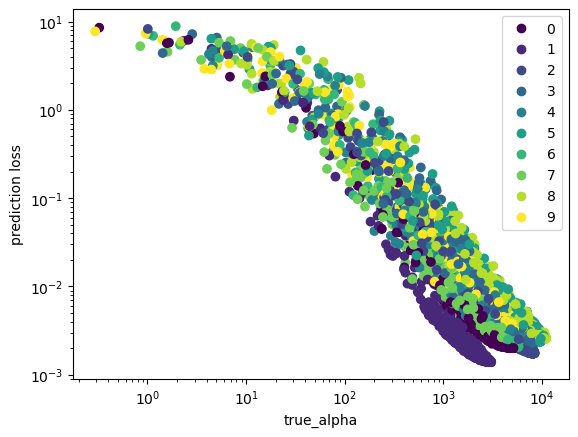

In [53]:
scatter = plt.scatter(true_alphas, losses, c=labels_batch, alpha=1)
plt.yscale('log')
plt.xscale('log')
plt.legend(*scatter.legend_elements())
plt.xlabel('true_alpha')
plt.ylabel('prediction loss')

Text(0, 0.5, 'prediction loss')

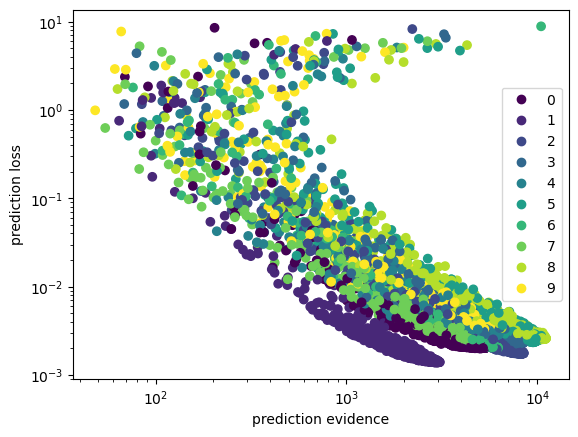

In [52]:
scatter = plt.scatter(evidences, losses, c=labels_batch, alpha=1)
plt.yscale('log')
plt.xscale('log')
plt.legend(*scatter.legend_elements())
plt.xlabel('prediction evidence')
plt.ylabel('prediction loss')

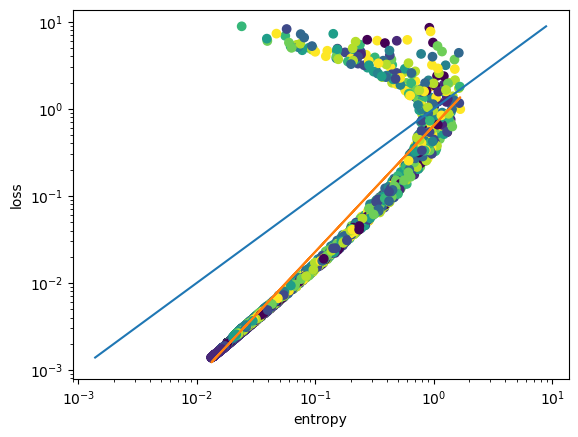

In [127]:
plt.scatter(entropies, losses, c=labels_batch)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('entropy')
plt.ylabel('loss')
plot_identity(losses, entropies)
regressor = LinearRegression()
regressor.fit(entropies.log().view(-1,1), losses.log())
log_loss_entropy_predictions = regressor.predict(entropies.log().view(-1,1))
plt.plot(entropies.view(-1,1), np.exp(log_loss_entropy_predictions))

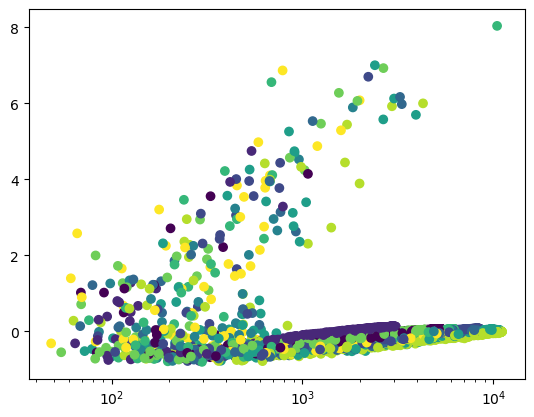

In [133]:
loss_entropy_residuals = losses.log()-log_loss_entropy_predictions
plt.scatter(evidences, loss_entropy_residuals, c=labels_batch)
plt.xscale('log')

In [124]:
regressor.score(entropies.log().view(-1,1), losses.log())

0.8797559270649

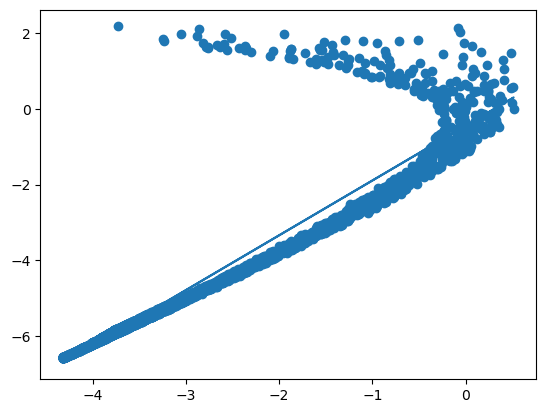

In [120]:
plt.scatter(entropies.log(), losses.log())
plt.plot(entropies.log().view(-1,1), regressor.predict(entropies.log().view(-1,1)))

In [116]:
regressor = LinearRegression()
regressor.fit(entropies.log().view(-1,1), losses.log())

LinearRegression()

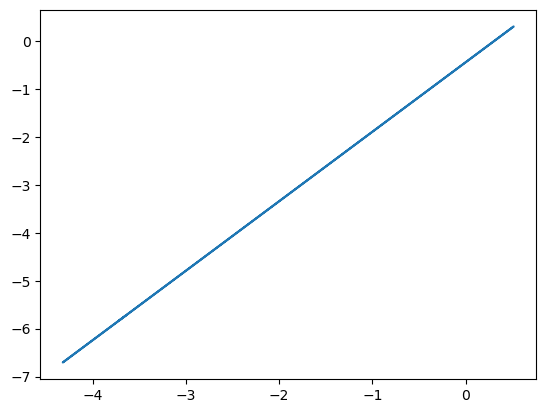

In [119]:
plt.plot(entropies.log().view(-1,1), regressor.predict(entropies.log().view(-1,1)))

In [114]:
pred_y.min()

-0.4417865551710129

Text(0, 0.5, 'entropy')

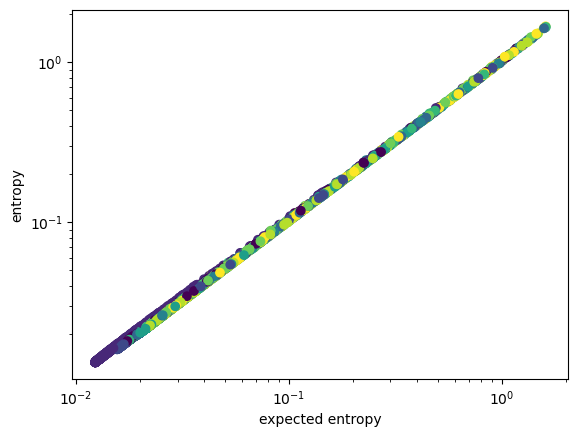

In [95]:
plt.scatter(expected_entropy, entropies, c=labels_batch)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('expected entropy')
plt.ylabel('entropy')

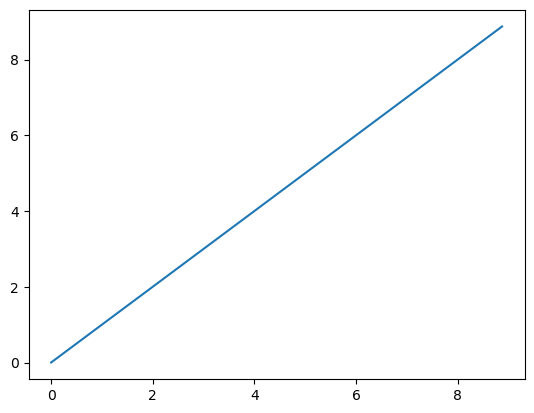

In [84]:
plot_identity(losses, entropies)

In [77]:
torch.cat((losses, entropies)).min().item()

0.0013895034790039062

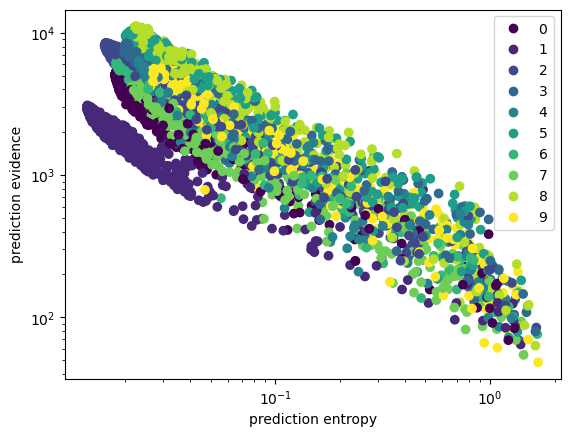

In [16]:
scatter = plt.scatter(entropies, evidences, c=labels_batch, alpha=1)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('prediction entropy')
plt.ylabel('prediction evidence')
plt.legend(*scatter.legend_elements())

<Axes: title={'center': 'evidence'}, xlabel='[label]'>

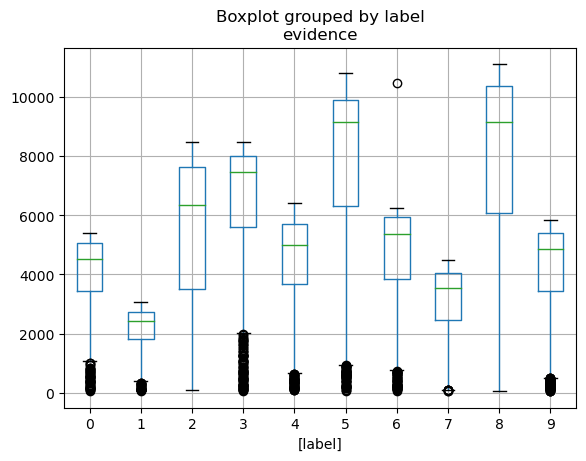

In [36]:
df = pd.DataFrame({'evidence': evidences, 'label': labels_batch})
df.groupby('label').evidence.agg(['mean', 'median', 'std'])
df.boxplot(by='label')

In [829]:
def delta_e_xent(a,b,p):
    grad = (scipy.special.polygamma(1,a+b) - p*scipy.special.polygamma(1,a)), (scipy.special.polygamma(1,a+b)-(1-p)*scipy.special.polygamma(1,b))
    val = -p*scipy.special.digamma(a) - (1-p)*scipy.special.digamma(b) + scipy.special.digamma(a+b) + p*np.log(p) + (1-p)*np.log(1-p)
    kl = -p*np.log(a/(a+b))-(1-p)*np.log(1-a/(a+b)) + p*np.log(p) +(1-p)*np.log(1-p)
    return grad, val, kl

In [741]:

a*(scipy.special.polygamma(1,a+b) - p*scipy.special.polygamma(1,a))

-0.13022548806820455

Text(0, 0.5, 'beta')

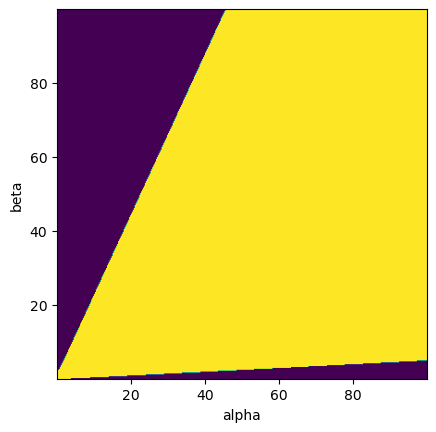

In [705]:
eta = .95
snap = True
p=.9
grid = np.zeros((400, 400))
a_vals = np.array(range(len(grid[0])))/4+.1
b_vals = np.array(range(len(grid)))/4+.1
for i in range(len(grid[0])):
    a = a_vals[i]
    for j in range(len(grid)):
        b = b_vals[j]
        grad, val, kl = delta_e_xent(a,b,(a+p)/(a+b+1))
        a_change = np.exp(np.log(a)-a*grad[0]*eta)-a
        b_change = np.exp(np.log(b)-b*grad[1]*eta)-b
        if snap:
            grid[j,i] = 1 if a_change+b_change> 0 else 0
        else:
            grid[j,i] = a_change+b_change
plt.imshow(grid, origin='lower', extent = [min(a_vals),max(a_vals), min(b_vals), max(b_vals)])
plt.xlabel('alpha')
plt.ylabel('beta')

(-3.2654384198323703, 1.620504352984144)
0.5 0.5 0.5 1.06121139 0.3681
(0.04605879056618434, 1.0236007010022568)
1.6429 -0.0672 1.0426 -1.78536785 nan
(0.4218808168556688, 1.3050365313348269)
1.6268 -0.4254 1.3541 -0.81773449 nan
(2.7063023152101424, 4.322581934897917)
1.4791 -0.8822 2.4779 -1.11665089 nan
(51.86915532210822, 56.68169747449079)
0.5319 -2.3951 -0.2855 -4.89276043 nan
(35.96639004094849, 59.73012611360601)
-17.6223 -22.2337 0.4421 -5.21557864 0.4678
(-55.99880856545848, 101.41617644702876)
-30.2105 -43.1392 0.4119 -2.183722 0.5263
(-71.86276985405375, 107.02079992909893)
-10.6109 -78.6349 0.1189 5.96120477 1.6041
(10.786498183161216, -1245.336307357502)
14.541 -116.0922 -0.1432 -0.1169969 nan
(-0.022011406596149793, 0.0007036285537495193)
10.7658 319.7755 0.0326 2.80124209 2.7602
(-0.02199403316011076, 0.0007036003822195819)
10.7735 319.7753 0.0326 2.80059014 2.7595
(-0.02197669944332637, 0.0007035722353160891)
10.7812 319.775 0.0326 2.7999392 2.7589
(-0.0219594052948568

/var/folders/y3/v5bw1qds23152m_g_1tzz7q80000gn/T/ipykernel_981/2058435876.py:3: RuntimeWarning: invalid value encountered in log
  val = -p*scipy.special.digamma(a) - (1-p)*scipy.special.digamma(b) + scipy.special.digamma(a+b) + p*np.log(p) + (1-p)*np.log(1-p)
/var/folders/y3/v5bw1qds23152m_g_1tzz7q80000gn/T/ipykernel_981/2058435876.py:4: RuntimeWarning: invalid value encountered in log
  kl = -p*np.log(a/(a+b))-(1-p)*np.log(1-a/(a+b)) + p*np.log(p) +(1-p)*np.log(1-p)


(0.0006146300186344032, -4.9511694790700146e-05)
23.8021 319.0946 0.0694 2.100737 2.083
(0.0006146302352848482, -4.95112953290606e-05)
23.8019 319.0946 0.0694 2.10074473 2.083
(-0.00907359246805565, 0.0006591836394214431)
23.8017 319.0947 0.0694 2.10075245 2.083
(0.0006146271694937775, -4.951678258470786e-05)
23.8049 319.0944 0.0694 2.10063849 2.0829
(-0.009072305024928404, 0.0006591742308540917)
23.8046 319.0944 0.0694 2.10064622 2.0829
(-0.009070924633328484, 0.0006591641466507933)
23.8078 319.0942 0.0694 2.10053229 2.0828
(0.0006146208184640862, -4.9528153538919064e-05)
23.811 319.094 0.0694 2.1004184 2.0827
(0.0006146210353978141, -4.952775411383231e-05)
23.8108 319.094 0.0694 2.10042612 2.0827
(-0.009069731729328604, 0.0006591554189888955)
23.8106 319.094 0.0694 2.10043384 2.0827
(-0.009068352437057925, 0.0006591453382795835)
23.8137 319.0938 0.0694 2.10031997 2.0826
(-0.009066973733795784, 0.0006591352594428903)
23.8169 319.0935 0.0695 2.10020614 2.0825
(-0.009065595619124775, 0.

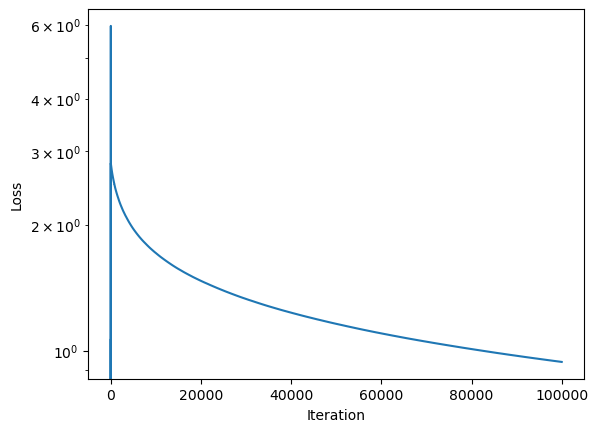

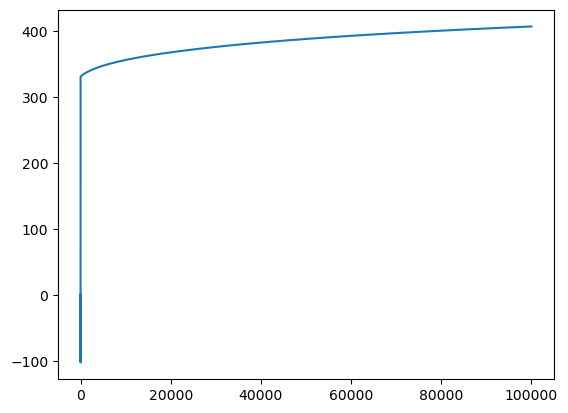

In [841]:
iterations = 100000
p_known = False
prob_switch_test = False
np.random.seed(0)
for log_space in [True]:
    a=.5
    b=.5
    p=.9
    eta = .35
    #.95 if log_space else .35
    grads = []
    vals = []
    kls = []
    a_list = []
    b_list = []
    for i in range(iterations):
        if prob_switch_test and i > iterations /2:
            p = 1-p
        a_list.append(a)
        b_list.append(b)
        if p_known:
            grad, val, kl = delta_e_xent(a,b,p)
        else:
            observation = np.random.binomial(1,p)
            # grad, _, _ = delta_e_xent(a,b,(a+observation*(a+b)**.5)/(a+b+(a+b)**.5))
            # grad, _, _ = delta_e_xent(a,b,(a+observation*100)/(a+b+100))
            grad, _, _ = delta_e_xent(a,b,(a+p)/(a+b+1))
            # grad, _, _ = delta_e_xent(a,b,p) # no observations, just fitting
            _, val, kl = delta_e_xent(a,b,p)
        grads.append(grad)
        vals.append(val)
        kls.append(kl)
        print(grad)
        print(round(a,4),round(b,4), round(a/(a+b),4), round(val, 8), round(kl,4))
        if log_space:
            a=np.exp(np.log(a)-a*grad[0]*eta)
            b=np.exp(np.log(b)-b*grad[1]*eta)
        else:
            a-=grad[0]*eta
            b-=grad[1]*eta
    plt.plot(range(iterations), vals)
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.show()
plt.plot(range(iterations), np.array(a_list)+np.array(b_list))

In [528]:
np.random.binomial(1,.9)

0

In [212]:
a=19
b=2.4
p=.9
-p*scipy.special.digamma(a) - (1-p)*scipy.special.digamma(b) + scipy.special.digamma(a+b)

0.3484512204023149

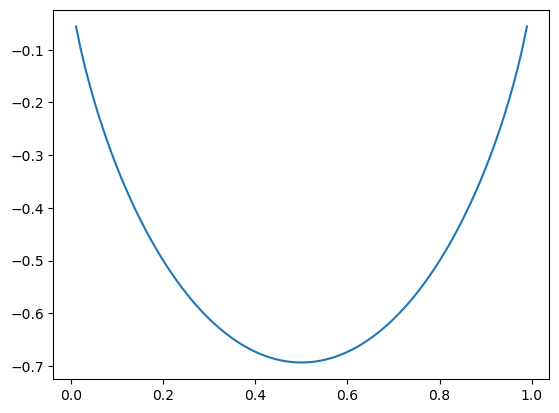

In [511]:
x = np.linspace(.01,.99,99)
y = x*np.log(x) + (1-x)*np.log(1-x)
plt.plot(x,y)

In [236]:
-p*scipy.special.digamma(a) - (1-p)*scipy.special.digamma(b) + scipy.special.digamma(a+b)

0.44561872447804485

Text(0.5, 1.0, 'Distribution of Model Evidence on test set')

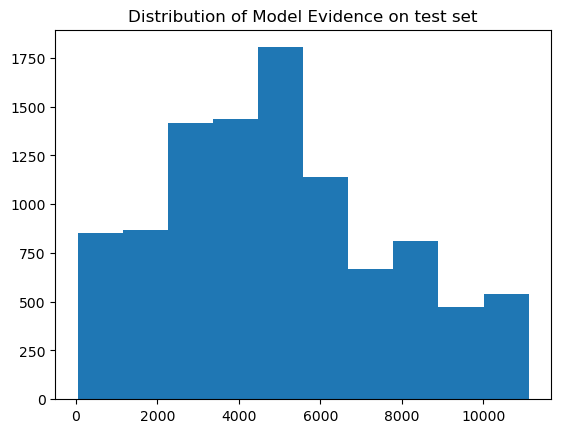

In [22]:
plt.hist(evidences, bins = 10)
plt.title('Distribution of Model Evidence on Test Set')

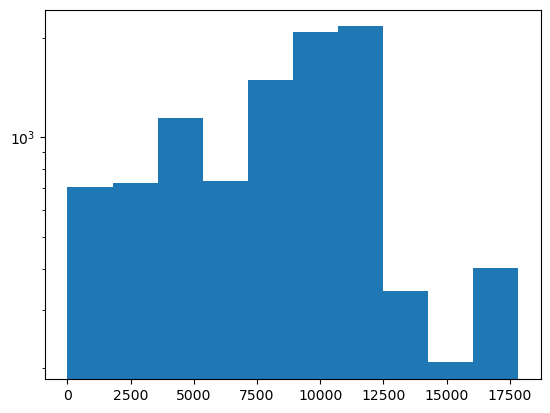

In [ ]:
plt.hist((true_alphas).view(-1).cpu().detach().numpy())
plt.yscale('log')

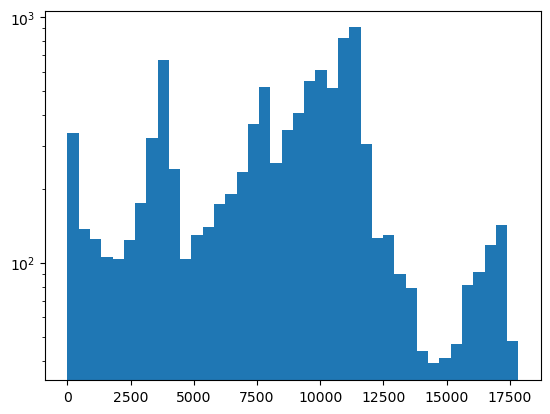

In [ ]:
plt.hist(true_alphas.view(-1).cpu().detach().numpy(), bins=40)
plt.yscale('log')

In [ ]:
scatter = plt.scatter((true_alphas/(true_alphas+true_betas)).view(-1).cpu().detach().numpy(),(true_alphas+true_betas).view(-1).cpu().detach().numpy(), c=labels_batch.numpy())
plt.yscale('log')
plt.legend(*scatter.legend_elements(), title="Classes")

NameError: name 'true_betas' is not defined

In [ ]:
labels_batch[((true_alphas>400)*( (true_alphas/(true_alphas+true_betas))<.8)*(.2<(true_alphas/(true_alphas+true_betas)))).view(-1)]

tensor([], dtype=torch.int64)

In [ ]:
labels_batch[((true_alphas<100)*((true_alphas/(true_alphas+true_betas))<.8)*(.2<(true_alphas/(true_alphas+true_betas)))).view(-1)]

tensor([3, 7, 7, 5, 3, 3, 9, 0, 6, 9, 2, 2, 7, 3, 2, 5, 1, 9, 3, 4, 5, 2, 9, 8,
        5, 7, 5, 9, 8, 8, 4, 3, 4, 2, 3, 9, 5, 5, 7, 4, 8, 7, 3, 9, 6, 2, 2, 2,
        5, 5, 8, 8, 8, 2, 2, 5, 8, 4, 8, 6, 4, 5, 3, 5, 2, 9, 7, 5, 5, 7, 2, 2,
        0, 9, 6, 2, 1, 6, 7, 4, 7, 3, 9, 3, 7, 8, 8, 6, 5, 8, 8, 3, 8, 9, 7, 9,
        5, 2, 4, 3, 4, 7, 4, 8, 5, 9, 3, 7, 9, 3, 3, 8, 5, 5, 4, 4, 7, 6, 6, 7,
        8, 2, 3, 9, 8, 9, 7, 7, 6, 3, 6, 9, 3, 5, 3, 5, 2, 6, 9, 1, 7, 6, 8, 7,
        5, 7, 5, 7, 5, 3, 8, 5, 2, 2, 0, 2, 8, 9, 4, 7, 0, 5, 7, 5, 3, 2, 5, 3,
        4, 8, 2, 9, 4, 2, 9, 5, 0, 9, 2, 1, 4, 6, 7, 3, 3, 9])

In [ ]:
a,b =model(torch.randn(1,784).to(device))

In [ ]:
a/(a+b)

tensor([[9.5481e-01, 2.9279e-03, 9.8478e-01, 9.9282e-01, 1.8893e-01, 8.7521e-02,
         8.6043e-04, 9.6548e-01, 7.5512e-01, 1.2076e-02]],
       grad_fn=<DivBackward0>)

In [ ]:
a+b

tensor([[ 1.3016,  0.6483,  0.7193,  0.3592,  7.6514,  1.8314, 12.3111,  0.8062,
          3.3017,  0.5943]], grad_fn=<AddBackward0>)

In [ ]:
labels_batch.numpy()

array([5, 8, 3, ..., 6, 0, 9])

In [ ]:
(alphas/(alphas+betas)).sum(axis=1).var()**.5

tensor(0.0836, grad_fn=<PowBackward0>)

(array([ 5914.,  3482.,   398.,   400.,  1142., 37007., 39177.,  6715.,
         3977.,  1788.]),
 array([-0.9655295 ,  0.34486392,  1.65525734,  2.9656508 ,  4.27604437,
         5.5864377 ,  6.89683104,  8.20722485,  9.51761818, 10.82801151,
        12.13840485]),
 <BarContainer object of 10 artists>)

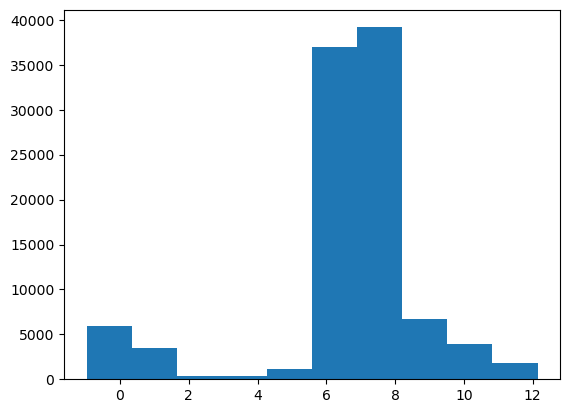

In [ ]:
plt.hist(np.log(betas.cpu().detach().numpy().flatten()))

In [ ]:
true_probs = true_alphas/(true_alphas+true_betas)

In [ ]:
probs = alphas/(alphas+betas)
evidence = alphas+betas

In [ ]:
losses = torch.digamma(alphas+betas).sum(axis=1) - torch.digamma(betas).sum(axis=1)+torch.digamma(true_betas).flatten()-torch.digamma(true_alphas).flatten()

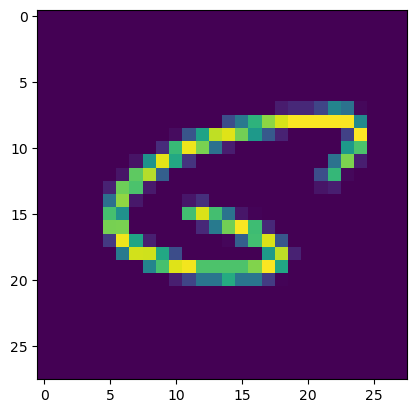

In [ ]:
plt.imshow(images[losses.argmax()].view(28,28))
plt.show()

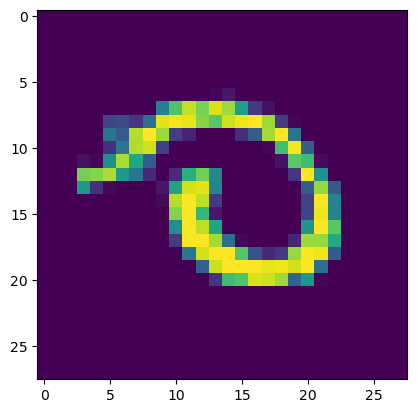

tensor(0)
tensor([0.0094, 0.0075, 0.1283, 0.3541, 0.0124, 0.0188, 0.0267, 0.0105, 0.2423,
        0.1899])
tensor(1.2977)


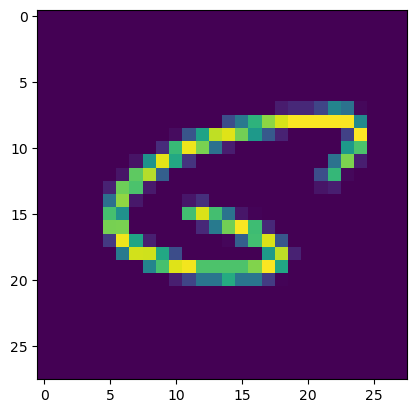

tensor(6)
tensor([0.0073, 0.0060, 0.0028, 0.0176, 0.0018, 0.8696, 0.0078, 0.0037, 0.0696,
        0.0138])
tensor(3.8510)


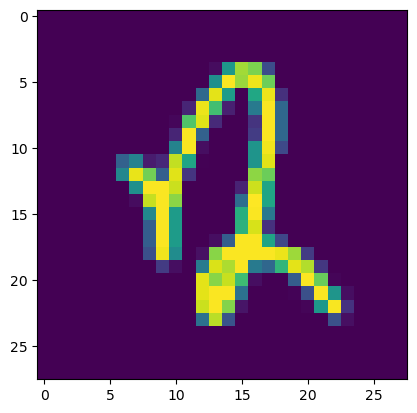

tensor(2)
tensor([0.0242, 0.0160, 0.0145, 0.0022, 0.6467, 0.0097, 0.0791, 0.0227, 0.0322,
        0.1529])
tensor(2.7549)


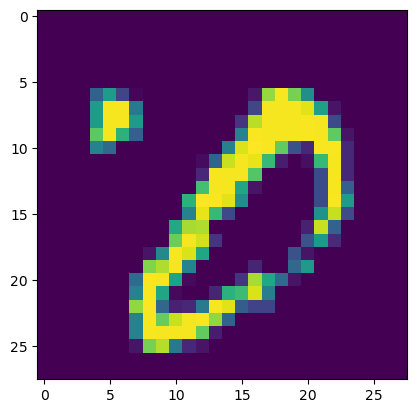

tensor(0)
tensor([0.0220, 0.0778, 0.0303, 0.3887, 0.0041, 0.0033, 0.0035, 0.0105, 0.4452,
        0.0147])
tensor(1.8726)


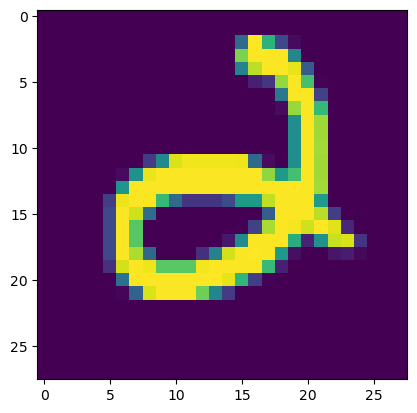

tensor(2)
tensor([0.0364, 0.0369, 0.0215, 0.3155, 0.0372, 0.0363, 0.4945, 0.0039, 0.0044,
        0.0134])
tensor(1.9174)


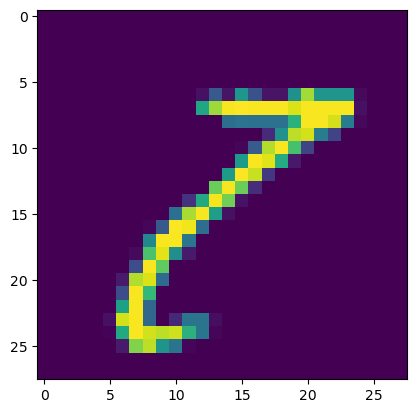

tensor(7)
tensor([0.0222, 0.0308, 0.0158, 0.2457, 0.0036, 0.0171, 0.0011, 0.0220, 0.6166,
        0.0251])
tensor(1.9399)


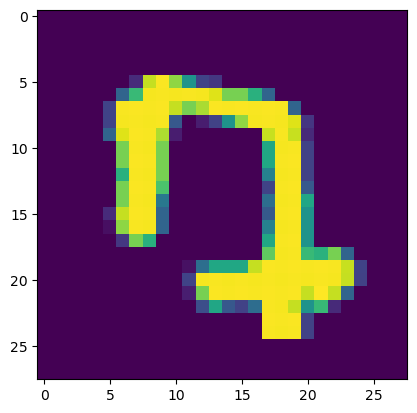

tensor(7)
tensor([0.3467, 0.0169, 0.1466, 0.0334, 0.0495, 0.0380, 0.0738, 0.0526, 0.1092,
        0.1333])
tensor(0.9099)


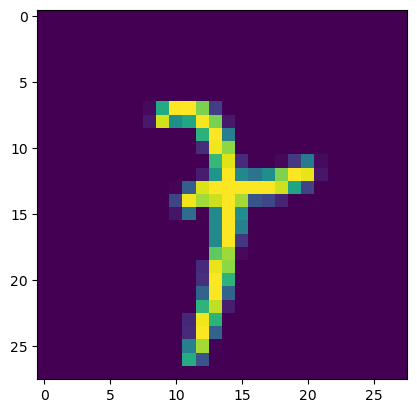

tensor(7)
tensor([0.0109, 0.0806, 0.0074, 0.0293, 0.0247, 0.0174, 0.0109, 0.0278, 0.6968,
        0.0943])
tensor(1.8925)


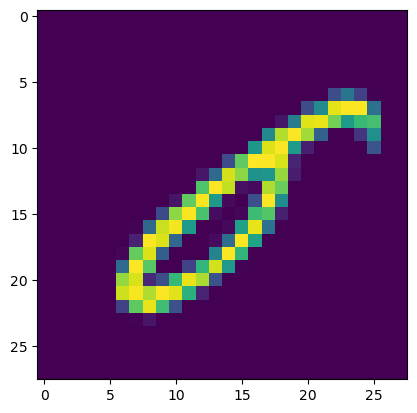

tensor(0)
tensor([0.0489, 0.0671, 0.0928, 0.0306, 0.0362, 0.2019, 0.0686, 0.0038, 0.4412,
        0.0089])
tensor(1.1294)


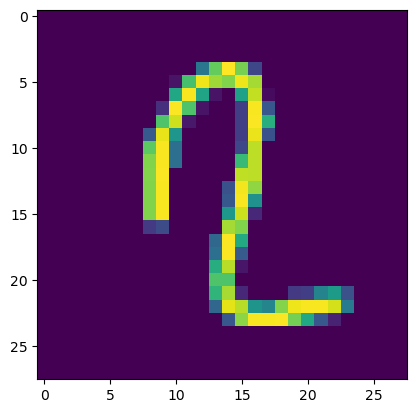

tensor(2)
tensor([0.0072, 0.0304, 0.0139, 0.0040, 0.0129, 0.0113, 0.0074, 0.0034, 0.8695,
        0.0400])
tensor(5.4287)


In [ ]:
for idx in losses.topk(10)[1]:
    image = images[idx].view(28,28)
    label = labels_batch[idx]
    plt.imshow(image)
    plt.show()
    print(label)
    print(probs[idx])
    print(evidences[idx])